In [71]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from PIL import Image
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
import torch.optim as optim
import torch.nn.functional as F
import colorama
from colorama import Fore, Style
from torchvision import datasets, transforms
from torch.utils.data import DataLoader


In [72]:
from google.colab import files
uploaded = files.upload()


KeyboardInterrupt: 

In [73]:
import zipfile
import os

with zipfile.ZipFile("archive.zip", 'r') as zip_ref:
    zip_ref.extractall("dataset")


In [74]:
for root, dirs, files in os.walk("dataset"):
    print(root)


dataset
dataset/PlantDiseases100x100
dataset/PlantDiseases100x100/PlantDiseases100x100
dataset/PlantDiseases100x100/PlantDiseases100x100/train_classified
dataset/PlantDiseases100x100/PlantDiseases100x100/train_classified/Image100
dataset/PlantDiseases100x100/PlantDiseases100x100/valid
dataset/PlantDiseases100x100/PlantDiseases100x100/valid/Image100
dataset/PlantDiseases100x100/PlantDiseases100x100/test
dataset/PlantDiseases100x100/PlantDiseases100x100/train
dataset/PlantDisease416x416
dataset/PlantDisease416x416/PlantDisease416x416
dataset/PlantDisease416x416/PlantDisease416x416/test
dataset/PlantDisease416x416/PlantDisease416x416/train


In [75]:
Root_dir = "/content/dataset/PlantDisease416x416/PlantDisease416x416"
train_dir = Root_dir + "/train"
test_dir = Root_dir + "/test"

# If there is no 'valid' folder, you can split from train manually
valid_dir = None  # Or split later

# Check the classes (each folder inside /train should be a disease class)
import os
Diseases_classes = os.listdir(train_dir)
print("Disease classes:", Diseases_classes)


Disease classes: ['Image416_1801.jpg', 'Image416_633.jpg', 'Image416_39.txt', 'Image416_1084.txt', 'Image416_2122.jpg', 'Image416_492.jpg', 'Image416_2087.jpg', 'Image416_2086.txt', 'Image416_653.txt', 'Image416_1246.txt', 'Image416_1339.jpg', 'Image416_1176.txt', 'Image416_2276.jpg', 'Image416_2182.jpg', 'Image416_339.txt', 'Image416_1385.txt', 'Image416_135.txt', 'Image416_851.jpg', 'Image416_1945.txt', 'Image416_363.txt', 'Image416_1701.jpg', 'Image416_2225.txt', 'Image416_2240.jpg', 'Image416_1210.txt', 'Image416_622.txt', 'Image416_997.jpg', 'Image416_1781.txt', 'Image416_2207.txt', 'Image416_743.jpg', 'Image416_2037.txt', 'Image416_1092.jpg', 'Image416_1976.jpg', 'Image416_343.txt', 'Image416_473.txt', 'Image416_1461.txt', 'Image416_1522.jpg', 'Image416_1081.txt', 'Image416_48.txt', 'Image416_2062.jpg', 'Image416_1691.jpg', 'Image416_666.txt', 'Image416_1496.jpg', 'Image416_1176.jpg', 'Image416_425.jpg', 'Image416_595.jpg', 'Image416_949.txt', 'Image416_705.txt', 'Image416_131.jp

In [76]:
Root_dir = "/content/dataset/PlantDiseases100x100/PlantDiseases100x100"
train_dir = Root_dir + "/train"
test_dir = Root_dir + "/test"
valid_dir = None  # if there's no 'valid'

import os
Diseases_classes = os.listdir(train_dir)
print("Disease classes:", Diseases_classes)


Disease classes: ['Image100_1493.jpg', 'Image100_9.jpg', 'Image100_712.jpg', 'Image100_2326.txt', 'Image100_1400.txt', 'Image100_1675.jpg', 'Image100_2239.txt', 'Image100_2145.txt', 'Image100_957.jpg', 'Image100_1763.jpg', 'Image100_216.txt', 'Image100_1134.txt', 'Image100_1796.txt', 'Image100_2170.jpg', 'Image100_28.jpg', 'Image100_230.jpg', 'Image100_1748.txt', 'Image100_325.jpg', 'Image100_2248.jpg', 'Image100_2069.txt', 'Image100_1116.txt', 'Image100_1010.jpg', 'Image100_825.txt', 'Image100_67.txt', 'Image100_2267.txt', 'Image100_902.txt', 'Image100_598.txt', 'Image100_122.jpg', 'Image100_2162.txt', 'Image100_1223.txt', 'Image100_1927.jpg', 'Image100_1611.txt', 'Image100_1253.jpg', 'Image100_1293.txt', 'Image100_1999.jpg', 'Image100_226.txt', 'Image100_2081.jpg', 'Image100_494.txt', 'Image100_873.jpg', 'Image100_1246.txt', 'Image100_2008.jpg', 'Image100_1201.jpg', 'Image100_1445.jpg', 'Image100_1122.txt', 'Image100_1830.jpg', 'Image100_1578.txt', 'Image100_1402.txt', 'Image100_713.

In [77]:
from colorama import Fore, Style, init
init(autoreset=True)


In [78]:
print(Fore.GREEN + str(Diseases_classes))
print(Fore.CYAN + "\nTotal number of classes are: " + str(len(Diseases_classes)))


['Image100_1493.jpg', 'Image100_9.jpg', 'Image100_712.jpg', 'Image100_2326.txt', 'Image100_1400.txt', 'Image100_1675.jpg', 'Image100_2239.txt', 'Image100_2145.txt', 'Image100_957.jpg', 'Image100_1763.jpg', 'Image100_216.txt', 'Image100_1134.txt', 'Image100_1796.txt', 'Image100_2170.jpg', 'Image100_28.jpg', 'Image100_230.jpg', 'Image100_1748.txt', 'Image100_325.jpg', 'Image100_2248.jpg', 'Image100_2069.txt', 'Image100_1116.txt', 'Image100_1010.jpg', 'Image100_825.txt', 'Image100_67.txt', 'Image100_2267.txt', 'Image100_902.txt', 'Image100_598.txt', 'Image100_122.jpg', 'Image100_2162.txt', 'Image100_1223.txt', 'Image100_1927.jpg', 'Image100_1611.txt', 'Image100_1253.jpg', 'Image100_1293.txt', 'Image100_1999.jpg', 'Image100_226.txt', 'Image100_2081.jpg', 'Image100_494.txt', 'Image100_873.jpg', 'Image100_1246.txt', 'Image100_2008.jpg', 'Image100_1201.jpg', 'Image100_1445.jpg', 'Image100_1122.txt', 'Image100_1830.jpg', 'Image100_1578.txt', 'Image100_1402.txt', 'Image100_713.txt', 'Image100_9


Total Number of Images: 2330



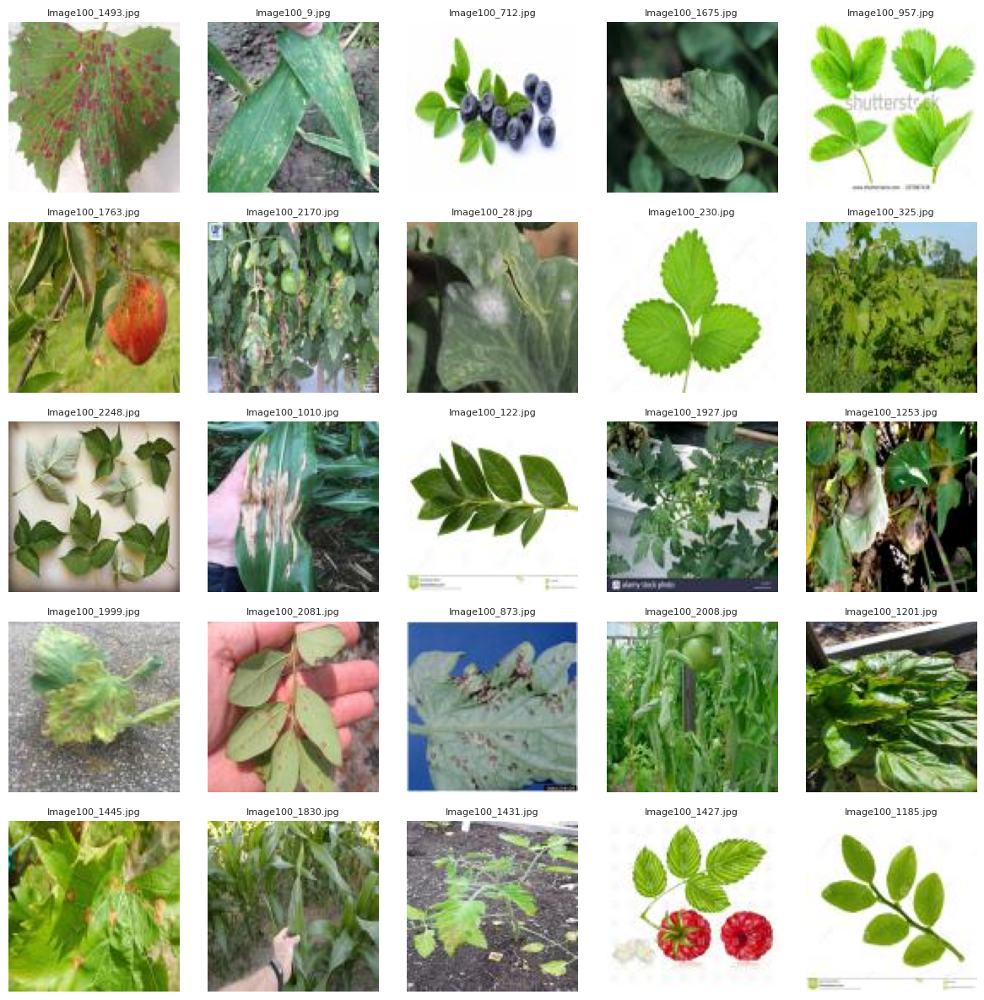

In [79]:
from PIL import Image, UnidentifiedImageError
import matplotlib.pyplot as plt
import os

image_files = os.listdir(train_dir)
image_files = [f for f in image_files if f.lower().endswith(('.png', '.jpg', '.jpeg'))]  # ✅ Keep only image files

tot_images = len(image_files)
print(Fore.CYAN + f"\nTotal Number of Images: {tot_images}\n")

# Show first 25 images
plt.figure(figsize=(12, 12))
shown = 0

for img_name in image_files:
    if shown >= 25:
        break

    img_path = os.path.join(train_dir, img_name)

    try:
        img = Image.open(img_path)
        plt.subplot(5, 5, shown + 1)
        plt.imshow(img)
        plt.title(img_name, fontsize=8)
        plt.axis('off')
        shown += 1
    except UnidentifiedImageError:
        print(Fore.RED + f"Skipped unreadable file: {img_name}")

plt.tight_layout()
plt.show()


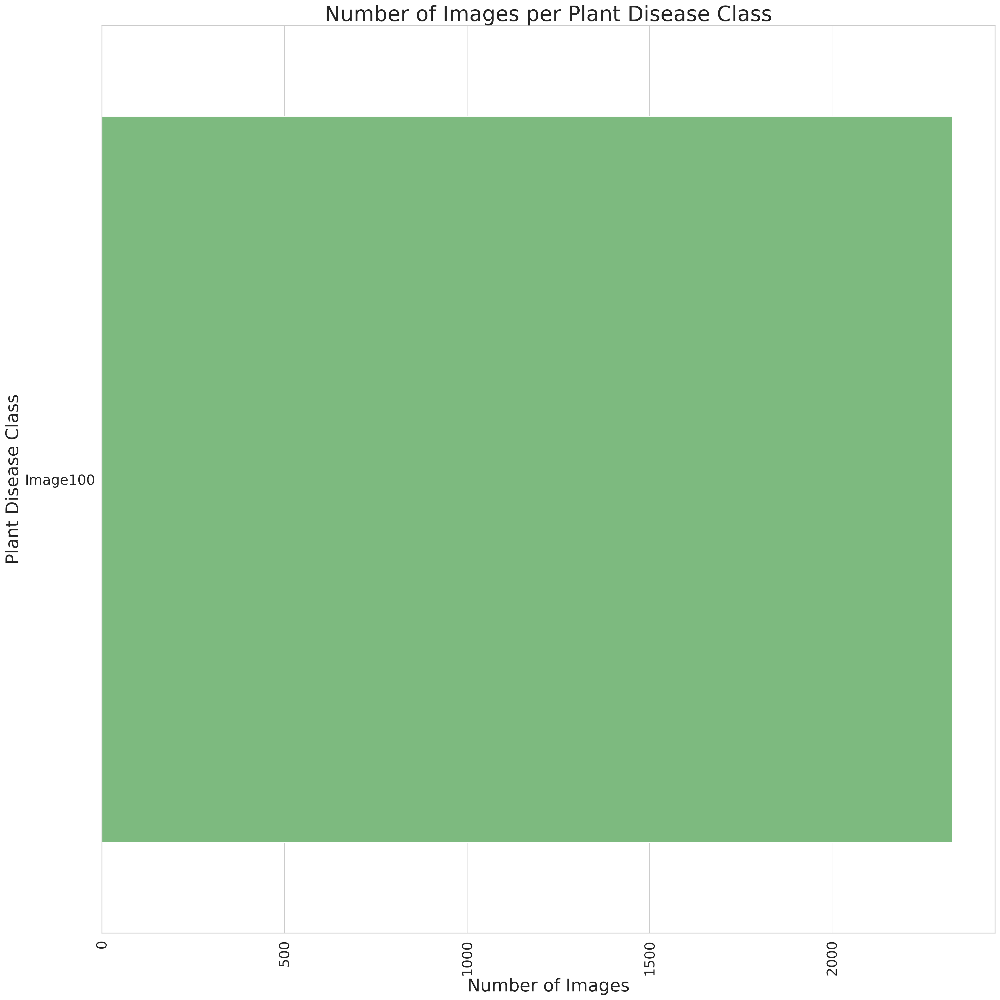

In [80]:
image_files = [f for f in os.listdir(train_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Create a dictionary to count images by class
class_count = {}

for img in image_files:
    # Assuming class name is the part before the first '_'
    class_name = img.split('_')[0]

    # Count images per class
    if class_name not in class_count:
        class_count[class_name] = 0
    class_count[class_name] += 1

# Sort the classes by the number of images in descending order
sorted_classes = sorted(class_count.items(), key=lambda x: x[1], reverse=True)

# Unzip sorted classes and counts
plant_names, Len = zip(*sorted_classes)

# Create the barplot
sns.set(style="whitegrid", color_codes=True)
plt.figure(figsize=(20, 20), dpi=200)

# Bar plot with additional customization
ax = sns.barplot(x=Len, y=plant_names, palette="Greens")

# Adjust the font size for better readability
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Number of Images', fontsize=25)
plt.ylabel('Plant Disease Class', fontsize=25)
plt.title('Number of Images per Plant Disease Class', fontsize=30)

# Rotate x-axis labels if needed for readability
plt.xticks(rotation=90)

# Show the plot
plt.tight_layout()
plt.show()

In [105]:
train = ImageFolder(train_dir, transform=transforms.ToTensor())
valid = ImageFolder(valid_dir, transform=transforms.ToTensor())

In [106]:
train


Dataset ImageFolder
    Number of datapoints: 1466
    Root location: /content/dataset/PlantDiseases100x100/PlantDiseases100x100/train_classified
    StandardTransform
Transform: ToTensor()

In [108]:
train[0]

(tensor([[[0.2902, 0.2941, 0.2667,  ..., 0.1882, 0.1804, 0.0627],
          [0.2314, 0.3255, 0.2863,  ..., 0.1765, 0.1294, 0.0549],
          [0.1451, 0.3098, 0.3216,  ..., 0.2745, 0.2000, 0.1765],
          ...,
          [0.1843, 0.2941, 0.2784,  ..., 0.4039, 0.2941, 0.0314],
          [0.2863, 0.3686, 0.3333,  ..., 0.4000, 0.3333, 0.1333],
          [0.3294, 0.3922, 0.3569,  ..., 0.3882, 0.3843, 0.3020]],
 
         [[0.4863, 0.4902, 0.4431,  ..., 0.2941, 0.2980, 0.1804],
          [0.4157, 0.5020, 0.4627,  ..., 0.2784, 0.2353, 0.1608],
          [0.3059, 0.4706, 0.4824,  ..., 0.3608, 0.2980, 0.2784],
          ...,
          [0.3569, 0.4667, 0.4471,  ..., 0.5725, 0.4471, 0.1725],
          [0.4588, 0.5412, 0.5020,  ..., 0.5922, 0.5098, 0.3020],
          [0.5020, 0.5647, 0.5255,  ..., 0.5882, 0.5686, 0.4784]],
 
         [[0.3490, 0.3529, 0.3137,  ..., 0.1647, 0.1647, 0.0471],
          [0.2824, 0.3725, 0.3333,  ..., 0.1412, 0.0980, 0.0235],
          [0.1882, 0.3529, 0.3569,  ...,

In [111]:
train[1400]

(tensor([[[0.3373, 0.4431, 0.5373,  ..., 0.6980, 0.3922, 0.4784],
          [0.3725, 0.5059, 0.6000,  ..., 0.8157, 0.6667, 0.4588],
          [0.4706, 0.4353, 0.5451,  ..., 0.8078, 0.8275, 0.3333],
          ...,
          [0.7216, 0.7176, 0.7137,  ..., 0.5451, 0.5569, 0.5451],
          [0.7098, 0.7059, 0.7059,  ..., 0.3843, 0.4000, 0.3882],
          [0.7059, 0.7020, 0.7020,  ..., 0.3020, 0.3176, 0.3098]],
 
         [[0.2549, 0.3608, 0.4667,  ..., 0.6431, 0.3373, 0.4235],
          [0.2902, 0.4353, 0.5294,  ..., 0.7804, 0.6314, 0.4235],
          [0.3961, 0.3686, 0.4784,  ..., 0.8157, 0.8353, 0.3412],
          ...,
          [0.7137, 0.7098, 0.7059,  ..., 0.4745, 0.4863, 0.4745],
          [0.7020, 0.6980, 0.6980,  ..., 0.3137, 0.3255, 0.3176],
          [0.6980, 0.6941, 0.6941,  ..., 0.2275, 0.2431, 0.2353]],
 
         [[0.1725, 0.2784, 0.3804,  ..., 0.5922, 0.2863, 0.3725],
          [0.2157, 0.3490, 0.4510,  ..., 0.7137, 0.5647, 0.3569],
          [0.3294, 0.2902, 0.4078,  ...,

In [112]:
img, label = train[0]
print(img.shape, label)

torch.Size([3, 100, 100]) 0



Label :Image100(0)

Label :Image100(0)

Label :Image100(0)

Label :Image100(0)

Label :Image100(0)

Label :Image100(0)

Label :Image100(0)

Label :Image100(0)


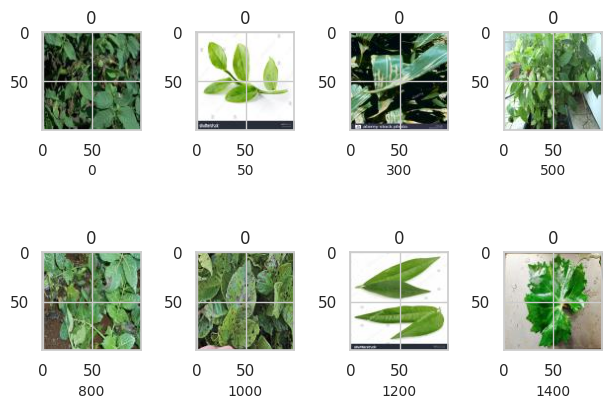

In [115]:
def show_image(image, label):
    print("Label :" + train.classes[label] + "(" + str(label) + ")")
    plt.imshow(image.permute(1, 2, 0))


image_list = [0, 50, 300, 500, 800, 1000, 1200, 1400]

chs = 0
for img in image_list:
    chs += 1
    plt.subplot(2,4,chs)
    print(Fore.GREEN)
    plt.tight_layout()
    plt.xlabel(img,fontsize=10)
    plt.title(train[img][1])
    show_image(*train[img])

In [117]:
batch_size = 32

In [118]:
train_dataloader = DataLoader(train, batch_size, shuffle=True, num_workers=2, pin_memory=True)
valid_dataloader = DataLoader(valid, batch_size, num_workers=2, pin_memory=True)

In [119]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available:
        return torch.device("cuda")
    else:
        return torch.device("cpu")

In [120]:
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

In [121]:
class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dataloader, device):
        self.dataloader = dataloader
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dataloader:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dataloader)

In [122]:
device = get_default_device()
device

device(type='cuda')

In [123]:
train_dataloader = DeviceDataLoader(train_dataloader, device)
valid_dataloader = DeviceDataLoader(valid_dataloader, device)

In [124]:
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

In [147]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# Base class for training and validation
class ImageClassificationBase(nn.Module):
    def training_step(self, batch):
        images, labels = batch
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels)  # Calculate loss
        return loss

    def validation_step(self, batch):
        images, labels = batch
        out = self(images)                   # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        acc = accuracy(out, labels)         # Calculate accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}

    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}

    def epoch_end(self, epoch, result):
        print(f"Epoch [{epoch+1}], train_loss: {result['train_loss']:.4f}, val_loss: {result['val_loss']:.4f}, val_acc: {result['val_acc']:.4f}")

# Accuracy function
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

# Reusable block
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, pool=False):
        super().__init__()
        layers = [nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
                  nn.BatchNorm2d(out_channels),
                  nn.ReLU(inplace=True)]
        if pool:
            layers.append(nn.MaxPool2d(2))
        self.block = nn.Sequential(*layers)

    def forward(self, x):
        return self.block(x)

# Final CNN model
class CNN_NeuralNet(ImageClassificationBase):
    def __init__(self, in_channels, num_diseases):
        super().__init__()

        self.conv1 = ConvBlock(in_channels, 64)
        self.conv2 = ConvBlock(64, 128, pool=True)
        self.res1 = nn.Sequential(ConvBlock(128, 128), ConvBlock(128, 128))

        self.conv3 = ConvBlock(128, 256, pool=True)
        self.conv4 = ConvBlock(256, 512, pool=True)
        self.res2 = nn.Sequential(ConvBlock(512, 512), ConvBlock(512, 512))

        # ✅ Fix applied here
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 1)),  # Replaces problematic MaxPool2d
            nn.Flatten(),
            nn.Linear(512, num_diseases)
        )

    def forward(self, x):
        out = self.conv1(x)
        out = self.conv2(out)
        out = self.res1(out) + out
        out = self.conv3(out)
        out = self.conv4(out)
        out = self.res2(out) + out
        out = self.classifier(out)
        return out


In [149]:
model = to_device(CNN_NeuralNet(3, len(train.classes)), device)

In [150]:
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)

In [151]:
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

In [152]:
def fit_OneCycle(epochs, max_lr, model, train_loader, val_loader, weight_decay=0,
                grad_clip=None, opt_func=torch.optim.SGD):
    torch.cuda.empty_cache()
    history = []  #For collecting the results

    optimizer = opt_func(model.parameters(), max_lr, weight_decay=weight_decay)
    # scheduler for one cycle learniing rate
    #Sets the learning rate of each parameter group according to the 1cycle learning rate policy.
    #The 1cycle policy anneals the learning rate from an initial learning rate to some
    #maximum learning rate and then from that maximum learning rate to some minimum learning rate
    #much lower than the initial learning rate.
    sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr,
                                                epochs=epochs, steps_per_epoch=len(train_loader))

    for epoch in range(epochs):
        # Training
        model.train()
        train_losses = []
        lrs = []
        for batch in train_loader:
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()

            # gradient clipping
            #Clip the gradients of an iterable of parameters at specified value.
            #All from pytorch documantation.
            if grad_clip:
                nn.utils.clip_grad_value_(model.parameters(), grad_clip)

            optimizer.step()
            optimizer.zero_grad()
            lrs.append(get_lr(optimizer))
            sched.step()
             # validation

        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        result['lrs'] = lrs
        model.epoch_end(epoch, result)
        history.append(result)

    return history

In [153]:
%%time
history = [evaluate(model, valid_dataloader)]
history

CPU times: user 755 ms, sys: 182 ms, total: 937 ms
Wall time: 1.29 s


[{'val_loss': 0.0, 'val_acc': 1.0}]

In [154]:
num_epoch = 5
lr_rate = 0.01
grad_clip = 0.15
weight_decay = 1e-4
optims = torch.optim.Adam

In [155]:
%%time
history += fit_OneCycle(num_epoch, lr_rate, model, train_dataloader, valid_dataloader,
                             grad_clip=grad_clip,
                             weight_decay=weight_decay,
                             opt_func=optims)

Epoch [1], train_loss: 0.0000, val_loss: 0.0000, val_acc: 1.0000
Epoch [2], train_loss: 0.0000, val_loss: 0.0000, val_acc: 1.0000
Epoch [3], train_loss: 0.0000, val_loss: 0.0000, val_acc: 1.0000
Epoch [4], train_loss: 0.0000, val_loss: 0.0000, val_acc: 1.0000
Epoch [5], train_loss: 0.0000, val_loss: 0.0000, val_acc: 1.0000
CPU times: user 12 s, sys: 6.23 s, total: 18.2 s
Wall time: 21.2 s


In [156]:
val_acc = []
val_loss = []
train_loss = []

for i in history:
    val_acc.append(i['val_acc'])
    val_loss.append(i['val_loss'])
    train_loss.append(i.get('train_loss'))

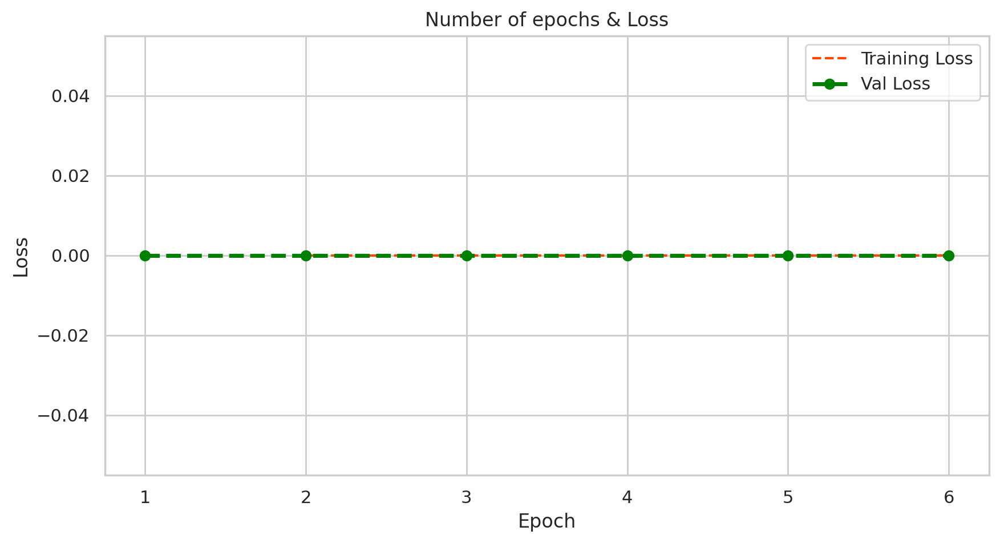

In [157]:
epoch_count = range(1,7)
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, train_loss, 'r--', color= 'orangered')
plt.plot(epoch_count, val_loss, '--bo',color= 'green', linewidth = '2.5', label='line with marker')
plt.legend(['Training Loss', 'Val Loss'])
plt.title('Number of epochs & Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(np.arange(1,7,1))
plt.show();

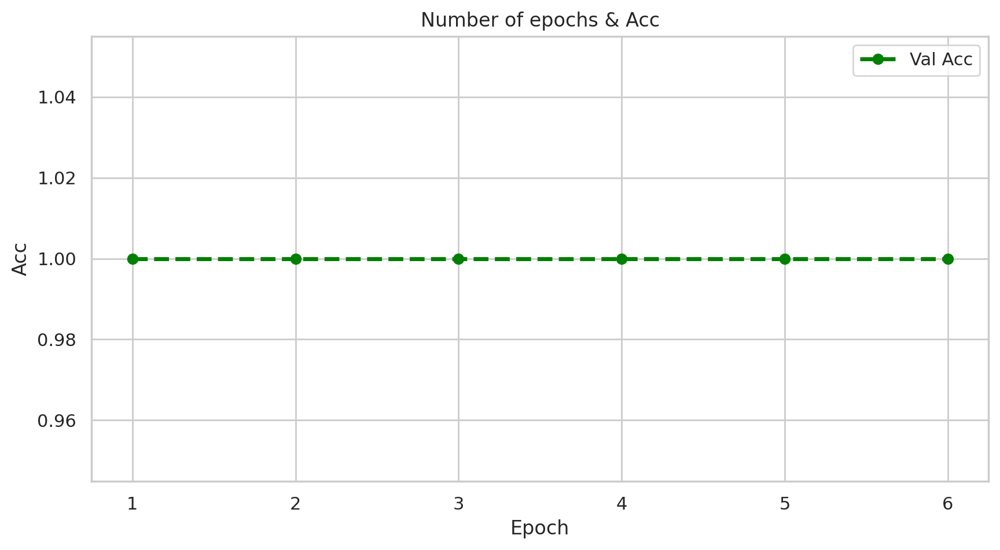

In [158]:
epoch_count = range(1,7)
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, val_acc, '--bo',color= 'green', linewidth = '2.5', label='line with marker')
plt.legend(['Val Acc'])
plt.title('Number of epochs & Acc')
plt.xlabel('Epoch')
plt.ylabel('Acc')
plt.xticks(np.arange(1,7,1))
plt.show();

In [161]:
from PIL import Image
import os

# Define the test directory
test_dir = "/content/dataset/PlantDiseases100x100/PlantDiseases100x100/test"
test_images = sorted(os.listdir(test_dir))

# Filter only image files (e.g., .jpg, .png, .jpeg)
image_extensions = ['.jpg', '.jpeg', '.png']
valid_images = [img for img in test_images if any(img.endswith(ext) for ext in image_extensions)]

# Define the transformations
transform = transforms.Compose([
    transforms.Resize((100, 100)),  # Adjust to the required input size
    transforms.ToTensor()
])

# Load images and apply transformations
test_data = []
for img_name in valid_images:
    img_path = os.path.join(test_dir, img_name)
    img = Image.open(img_path).convert('RGB')  # Ensure the image is in RGB format
    img = transform(img)
    test_data.append(img)

print(f"Loaded {len(test_data)} images.")


Loaded 202 images.


In [162]:
# Check for non-image files
non_image_files = [f for f in os.listdir(test_dir) if not any(f.endswith(ext) for ext in image_extensions)]
print("Non-image files found:", non_image_files)


Non-image files found: ['testImage100_191.txt', 'testImage100_112.txt', 'testImage100_125.txt', 'testImage100_28.txt', 'testImage100_117.txt', 'testImage100_93.txt', 'testImage100_115.txt', 'testImage100_172.txt', 'testImage100_22.txt', 'testImage100_158.txt', 'testImage100_142.txt', 'testImage100_153.txt', 'testImage100_135.txt', 'testImage100_68.txt', 'testImage100_16.txt', 'testImage100_165.txt', 'testImage100_114.txt', 'testImage100_24.txt', 'testImage100_102.txt', 'testImage100_154.txt', 'testImage100_32.txt', 'testImage100_155.txt', 'testImage100_166.txt', 'testImage100_130.txt', 'testImage100_157.txt', 'testImage100_83.txt', 'testImage100_103.txt', 'testImage100_49.txt', 'testImage100_94.txt', 'testImage100_145.txt', 'testImage100_43.txt', 'testImage100_124.txt', 'testImage100_186.txt', 'testImage100_175.txt', 'testImage100_170.txt', 'testImage100_141.txt', 'testImage100_8.txt', 'testImage100_174.txt', 'testImage100_36.txt', 'testImage100_126.txt', 'testImage100_44.txt', 'testIm

In [164]:
def predict_image(img, model):
    """Converts image to array and return the predicted class
        with highest probability"""
    # Convert to a batch of 1
    xb = to_device(img.unsqueeze(0), device)
    # Get predictions from model
    yb = model(xb)
    # Pick index with highest probability
    _, preds  = torch.max(yb, dim=1)
    # Retrieve the class label

    return train.classes[preds[0].item()]


Label: testImage100_107.jpg , Predicted: Image100


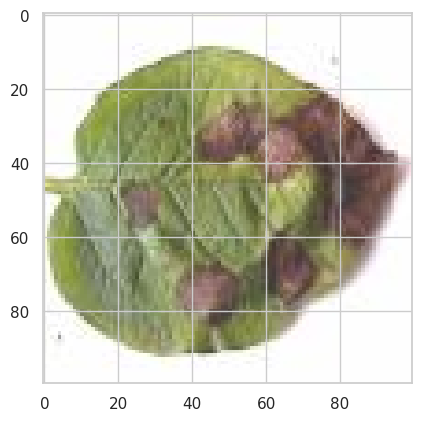

In [188]:
img = test_dataset[1]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[9], ', Predicted:', predict_image(img, model))


Label: testImage100_112.jpg , Predicted: Image100


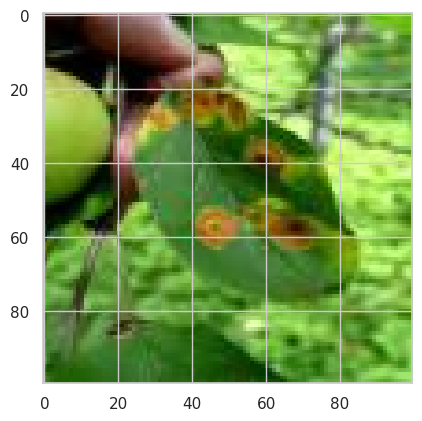

In [190]:
img = test_dataset[15]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[15], ', Predicted:', predict_image(img, model))


Label: testImage100_103.jpg , Predicted: Image100


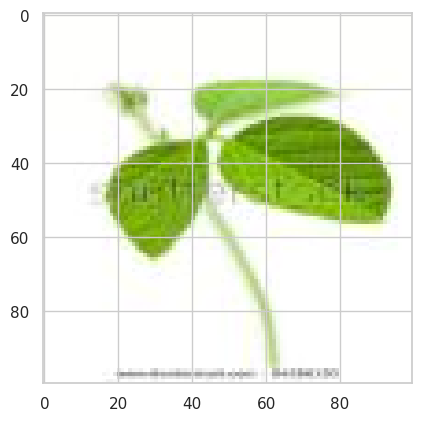

In [191]:
img = test_dataset[5]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[5], ', Predicted:', predict_image(img, model))


Label: testImage100_126.jpg , Predicted: Image100


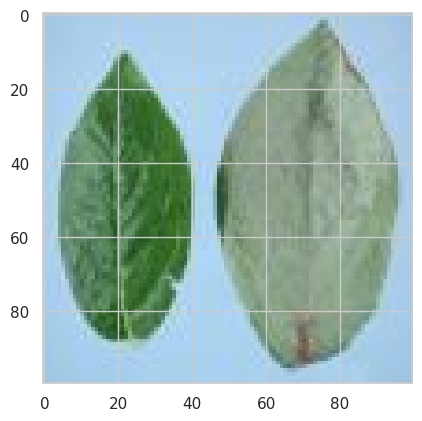

In [192]:
img = test_dataset[30]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[30], ', Predicted:', predict_image(img, model))

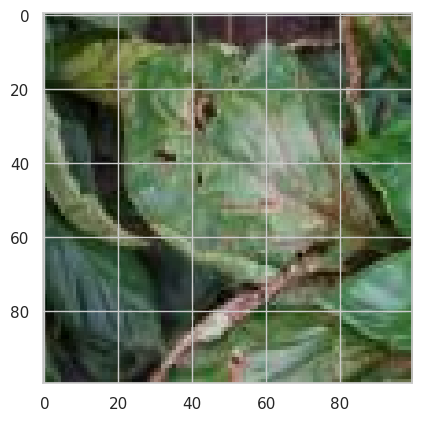

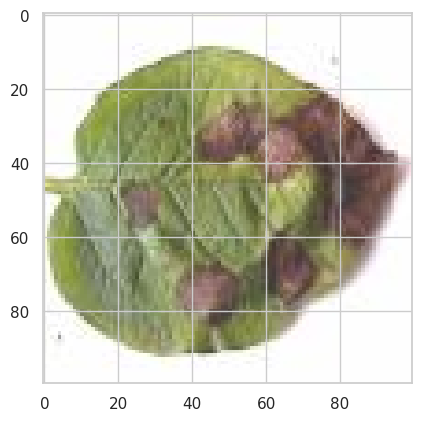

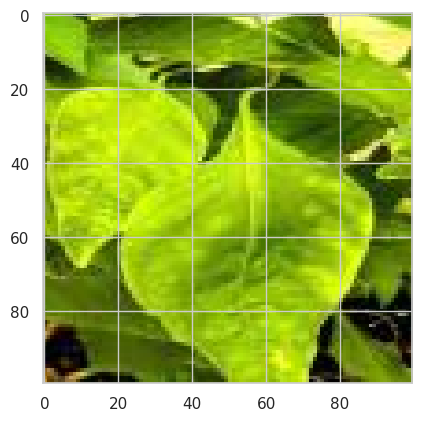

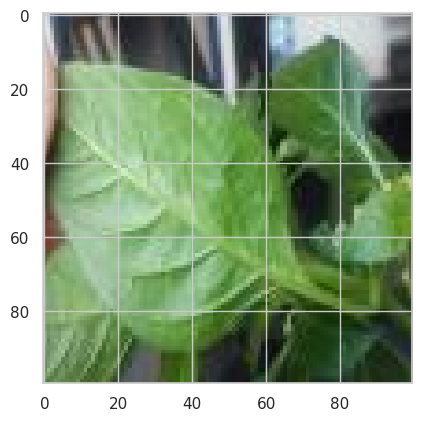

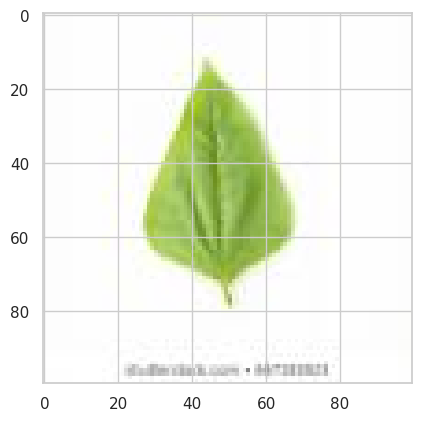

...

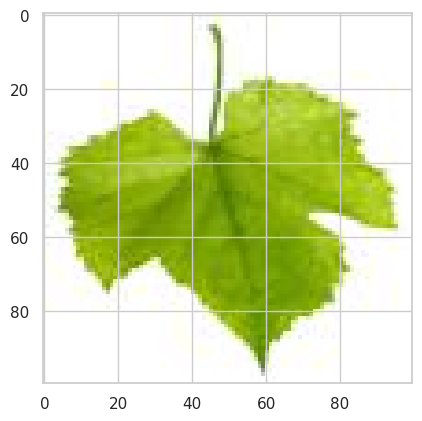

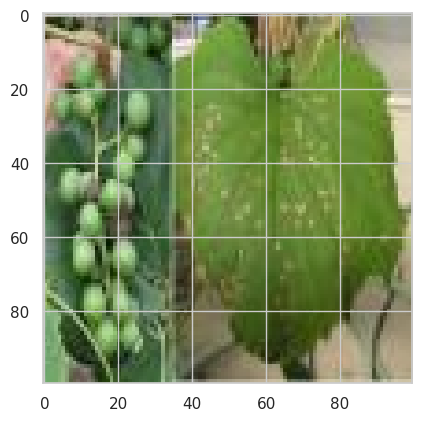

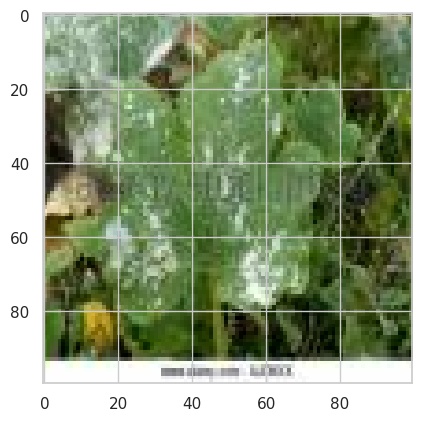

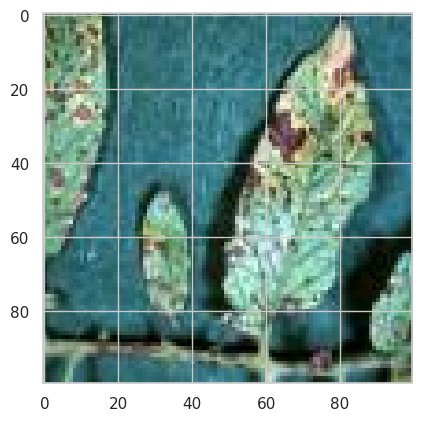

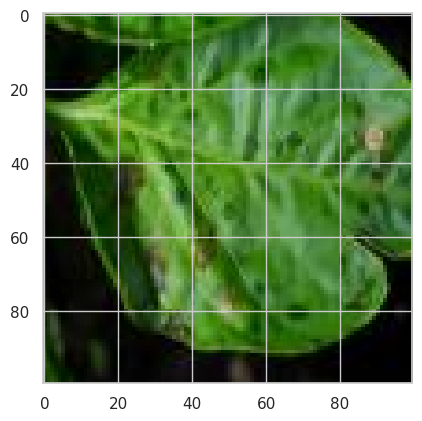

In [253]:
for i, img in enumerate(test_data):
    plt.imshow(img.permute(1, 2, 0))
    plt.show()
    print(Fore.GREEN)
